In [1]:
import os
import re
import lxml.etree as etree

def escape_ampersands(content):
    return re.sub(r'&(?!(amp;|lt;|gt;|apos;|quot;|#\d+;))', '&amp;', content)

def parse_xml(file_path):
    try:
        with open(file_path, 'r', encoding='utf-8') as file:
            content = file.read().strip()
            content = escape_ampersands(content)
        
        parser = etree.XMLParser(recover=True)  
        tree = etree.fromstring(content.encode('utf-8'), parser=parser)
        if parser.error_log:
            print(f"Errors during parsing {file_path}:")
            for error in parser.error_log:
                print(error.message, "at line", error.line)
        
        texts = tree.xpath('//TEXT//text()')
        return ' '.join(texts)
    except etree.XMLSyntaxError as e:
        print(f"XMLSyntaxError while parsing file {file_path}: {str(e)}")
        print(f"Content begins with: {content[:100]}")
        return None
    except Exception as e:
        print(f"General error with file {file_path}: {str(e)}")
        return None

def process_all_xml(root_directory):
    all_texts = []
    for root, dirs, files in os.walk(root_directory):
        for file in files:
            if file.endswith('.xml'):
                file_path = os.path.join(root, file)
                text = parse_xml(file_path)
                if text:
                    all_texts.append(text)
    return all_texts

root_directory = '/home/niralee/de-id/2006n2c2'
collected_texts = process_all_xml(root_directory)


Errors during parsing /home/niralee/de-id/2006n2c2/deid_surrogate_train_all_version2.xml:
Opening and ending tag mismatch: PHI line 25722 and TEXT at line 25833
Opening and ending tag mismatch: PHI line 25722 and RECORD at line 25834
Opening and ending tag mismatch: TEXT line 25681 and ROOT at line 53287


In [2]:
collected_texts

['\n 123547445 \n FIH \n 7111426 \n 47933/f911 \n 557344 \n 11/19 /1994 12:00:00 AM\nDischarge Summary\nUnsigned\nDIS\nReport Status :\nUnsigned\nADMISSION DATE :\n 11/19 /94\nDISCHARGE DATE :\n 11/28 /94\nADMISSION DIAGNOSIS :\nAspiration pneumonia , esophageal laceration .\nHISTORY OF PRESENT ILLNESS :\nMr.  Blind  is a 79-year-old white white male with a history of diabetes mellitus , inferior myocardial infarction , who underwent open repair of his increased diverticulum  November 13th  at  Sephsandpot Center  .\nThe patient developed hematemesis  November 15th  and was intubated for respiratory distress .\nHe was transferred to the  Valtawnprinceel Community Memorial Hospital  for endoscopy and esophagoscopy on the  16th of November  which showed a 2 cm linear tear of the esophagus at 30 to 32 cm .\nThe patient \'s hematocrit was stable and he was given no further intervention .\nThe patient attempted a gastrografin swallow on the  21st  , but was unable to cooperate with probable

In [3]:
type(collected_texts)

list

In [4]:
def clean_text(text):
    text = re.sub(r'\s+', ' ', text)
    text = text.strip()
    return text

In [5]:
cleaned_texts = [clean_text(text) for text in collected_texts]

In [6]:
cleaned_texts

['123547445 FIH 7111426 47933/f911 557344 11/19 /1994 12:00:00 AM Discharge Summary Unsigned DIS Report Status : Unsigned ADMISSION DATE : 11/19 /94 DISCHARGE DATE : 11/28 /94 ADMISSION DIAGNOSIS : Aspiration pneumonia , esophageal laceration . HISTORY OF PRESENT ILLNESS : Mr. Blind is a 79-year-old white white male with a history of diabetes mellitus , inferior myocardial infarction , who underwent open repair of his increased diverticulum November 13th at Sephsandpot Center . The patient developed hematemesis November 15th and was intubated for respiratory distress . He was transferred to the Valtawnprinceel Community Memorial Hospital for endoscopy and esophagoscopy on the 16th of November which showed a 2 cm linear tear of the esophagus at 30 to 32 cm . The patient \'s hematocrit was stable and he was given no further intervention . The patient attempted a gastrografin swallow on the 21st , but was unable to cooperate with probable aspiration . The patient also had been receiving g

In [7]:
combined_string = ' '.join(cleaned_texts)

In [8]:
combined_string

'123547445 FIH 7111426 47933/f911 557344 11/19 /1994 12:00:00 AM Discharge Summary Unsigned DIS Report Status : Unsigned ADMISSION DATE : 11/19 /94 DISCHARGE DATE : 11/28 /94 ADMISSION DIAGNOSIS : Aspiration pneumonia , esophageal laceration . HISTORY OF PRESENT ILLNESS : Mr. Blind is a 79-year-old white white male with a history of diabetes mellitus , inferior myocardial infarction , who underwent open repair of his increased diverticulum November 13th at Sephsandpot Center . The patient developed hematemesis November 15th and was intubated for respiratory distress . He was transferred to the Valtawnprinceel Community Memorial Hospital for endoscopy and esophagoscopy on the 16th of November which showed a 2 cm linear tear of the esophagus at 30 to 32 cm . The patient \'s hematocrit was stable and he was given no further intervention . The patient attempted a gastrografin swallow on the 21st , but was unable to cooperate with probable aspiration . The patient also had been receiving ge

In [9]:
import pandas as pd

In [10]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [11]:
dfTrain = pd.read_excel('/home/niralee/de-id/sanjeet_gemini/1596_summary_gemini_final.xlsx')

In [12]:
dfTrain

,Summaries,tags,Annotated_Summaries
0,\n\n244239321\nKGH\n5269489\n51843/82d5\n11/13...,"[{'start': '4', 'end': '13', 'text': '24423932...","<RECORD ID=""4567"">\n<TEXT>\n<PHI TYPE=""ID"">244..."
1,\n\n001062705\nRMLH\n0387431\n2426935\n1/2/98\...,"[{'start': '4', 'end': '13', 'text': '00106270...","<RECORD ID=""8675309"">\n<TEXT>\n<PHI TYPE=""ID"">..."
2,\n\n334302361\nKGMU\n8645704\n2298949\n1/2/98\...,"[{'start': '4', 'end': '13', 'text': '33430236...","<RECORD ID=""8675309"">\n<TEXT>\n<PHI TYPE=""ID"">..."
3,\n\n010760828\nFIH\n4604997\n76732/99w3\n50342...,"[{'start': '4', 'end': '13', 'text': '01076082...","<RECORD ID=""1001"">\n<TEXT>\n<PHI TYPE=""ID"">010..."
4,\n\n010760828\nFIH\n4604997\n76732/99w3\n50342...,"[{'start': '4', 'end': '13', 'text': '01076082...","<RECORD ID=""1002"">\n<TEXT>\n<PHI TYPE=""ID"">010..."
...,...,...,...
1591,\n\n1555662\nHIMTJH\n7145938\n1374210\n975452\...,"[{'start': '4', 'end': '11', 'text': '1555662'...","<RECORD ID=""1001"">\n<TEXT>\n<PHI TYPE=""ID"">155..."
1592,\n\n010760828\nFIH\n4604997\n76732/99w3\n50342...,"[{'start': '4', 'end': '13', 'text': '01076082...","<RECORD ID=""4135"">\n<TEXT>\n<PHI TYPE=""ID"">010..."
1593,\n\n2200428949\nGRMC\n3695398549\n380/2023\n00...,"[{'start': '4', 'end': '14', 'text': '22004289...","<RECORD ID=""95441"">\n<TEXT>\n<PHI TYPE=""ID"">22..."
1594,\n\n775908649\nSILVASA HOSPITAL\n22049738\n884...,"[{'start': '4', 'end': '13', 'text': '77590864...","<RECORD ID=""10250"">\n<TEXT>\n<PHI TYPE=""ID"">77..."


In [13]:
annotated_summaries_list = dfTrain['Annotated_Summaries'].tolist()

In [14]:
annotated_summaries_list

['<RECORD ID="4567">\\n<TEXT>\\n<PHI TYPE="ID">244239321</PHI>\\n<PHI TYPE="HOSPITAL">KGH</PHI>\\n<PHI TYPE="ID">5269489</PHI>\\n<PHI TYPE="ID">51843/82d5</PHI>\\n<PHI TYPE="DATE">11/13</PHI>/2023 12:00:00 AM\\nRESPIRATORY FAILURE DUE TO PULMONARY TUBERCULOSIS.\\nUnsigned\\nDIS\\nReport Status :\\nUnsigned\\nDISCHARGE SUMMARY\\nNAME :\\n<PHI TYPE="PATIENT">RUCHIKA SHARMA</PHI>\\nUNIT NUMBER :\\n<PHI TYPE="ID">238-39-84</PHI>\\nADMISSION DATE :\\n<PHI TYPE="DATE">11/13/2023</PHI>\\nDISCHARGE DATE :\\n<PHI TYPE="DATE">11/22/2023</PHI>\\nPRINCIPAL DIAGNOSIS :\\nRespiratory failure due to pulmonary tuberculosis.\\nPRINCIPAL PROCEDURE :\\nNone.\\nMEDICATIONS ON DISCHARGE :\\nIsoniazid 300 mg PO q. day , Rifampin 600 mg PO q. day , Pyrazinamide 1500 mg PO q. day , Ethambutol 1200 mg PO q. day , Azithromycin 500 mg PO q. day.\\nHer follow up is with the Department of Respiratory Medicine.\\nHISTORY OF PRESENT ILLNESS :\\nThis is a 25-year-old female who presents with complaints of productive 

In [15]:
cleaned_strings = [s.replace('\\n', ' ') for s in annotated_summaries_list]

In [16]:
cleaned_strings 

['<RECORD ID="4567"> <TEXT> <PHI TYPE="ID">244239321</PHI> <PHI TYPE="HOSPITAL">KGH</PHI> <PHI TYPE="ID">5269489</PHI> <PHI TYPE="ID">51843/82d5</PHI> <PHI TYPE="DATE">11/13</PHI>/2023 12:00:00 AM RESPIRATORY FAILURE DUE TO PULMONARY TUBERCULOSIS. Unsigned DIS Report Status : Unsigned DISCHARGE SUMMARY NAME : <PHI TYPE="PATIENT">RUCHIKA SHARMA</PHI> UNIT NUMBER : <PHI TYPE="ID">238-39-84</PHI> ADMISSION DATE : <PHI TYPE="DATE">11/13/2023</PHI> DISCHARGE DATE : <PHI TYPE="DATE">11/22/2023</PHI> PRINCIPAL DIAGNOSIS : Respiratory failure due to pulmonary tuberculosis. PRINCIPAL PROCEDURE : None. MEDICATIONS ON DISCHARGE : Isoniazid 300 mg PO q. day , Rifampin 600 mg PO q. day , Pyrazinamide 1500 mg PO q. day , Ethambutol 1200 mg PO q. day , Azithromycin 500 mg PO q. day. Her follow up is with the Department of Respiratory Medicine. HISTORY OF PRESENT ILLNESS : This is a 25-year-old female who presents with complaints of productive cough and breathlessness for the past 2 months. She has be

In [17]:
annotated_string = ' '.join(cleaned_strings)

In [18]:
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize, bigrams, trigrams, FreqDist
import string
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /home/niralee/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/niralee/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [19]:
def preprocess(text):
    text = text.lower()

    text = text.translate(str.maketrans('', '', string.punctuation))

    tokens = word_tokenize(text)

    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    return tokens

In [20]:
tokens_combined = preprocess(combined_string)
tokens_annotated = preprocess(annotated_string)

In [21]:
def find_top_ngrams(tokens, n=10):
    unigram_freq = FreqDist(tokens)
    bigram_freq = FreqDist(bigrams(tokens))
    trigram_freq = FreqDist(trigrams(tokens))

    top_unigrams = unigram_freq.most_common(n)
    top_bigrams = bigram_freq.most_common(n)
    top_trigrams = trigram_freq.most_common(n)

    return top_unigrams, top_bigrams, top_trigrams

In [22]:
top_unigrams_combined, top_bigrams_combined, top_trigrams_combined = find_top_ngrams(tokens_combined, 10)
top_unigrams_annotated, top_bigrams_annotated, top_trigrams_annotated = find_top_ngrams(tokens_annotated, 10)

In [23]:
def print_top_ngrams(title, unigrams, bigrams, trigrams):
    print(f"--- {title} ---")
    print("Top 10 Unigrams:", unigrams)
    print("Top 10 Bigrams:", bigrams)
    print("Top 10 Trigrams:", trigrams)
    print("\n")

print_top_ngrams("Combined String", top_unigrams_combined, top_bigrams_combined, top_trigrams_combined)
print_top_ngrams("Annotated String", top_unigrams_annotated, top_bigrams_annotated, top_trigrams_annotated)

--- Combined String ---
Top 10 Unigrams: [('patient', 7831), ('discharge', 5252), ('mg', 3752), ('po', 3584), ('history', 2912), ('admission', 2454), ('left', 2390), ('hospital', 2211), ('md', 2207), ('right', 2196)]
Top 10 Bigrams: [(('mg', 'po'), 2516), (('report', 'status'), 1073), (('discharge', 'date'), 934), (('hospital', 'course'), 921), (('discharge', 'summary'), 855), (('admission', 'date'), 838), (('po', 'qd'), 756), (('po', 'bid'), 712), (('physical', 'examination'), 687), (('dis', 'report'), 685)]
Top 10 Trigrams: [(('dis', 'report', 'status'), 685), (('report', 'status', 'unsigned'), 570), (('mg', 'po', 'bid'), 569), (('mg', 'po', 'qd'), 559), (('history', 'present', 'illness'), 558), (('unsigned', 'dis', 'report'), 538), (('past', 'medical', 'history'), 531), (('dis', 'admission', 'date'), 388), (('discharge', 'summary', 'unsigned'), 357), (('summary', 'unsigned', 'dis'), 357)]


--- Annotated String ---
Top 10 Unigrams: [('phi', 23149), ('patient', 7909), ('discharge', 5

In [24]:
def normalize_freqs(ngrams):
    total = sum(freq for _, freq in ngrams)
    return [(ngram, freq * 100 / total) for ngram, freq in ngrams]

top_unigrams_combined_norm = normalize_freqs(top_unigrams_combined)
top_bigrams_combined_norm = normalize_freqs(top_bigrams_combined)
top_trigrams_combined_norm = normalize_freqs(top_trigrams_combined)

top_unigrams_annotated_norm = normalize_freqs(top_unigrams_annotated)
top_bigrams_annotated_norm = normalize_freqs(top_bigrams_annotated)
top_trigrams_annotated_norm = normalize_freqs(top_trigrams_annotated)


In [25]:
def aggregate_ngram_freqs(top_unigrams, top_bigrams, top_trigrams):
    ngrams_labels = [label for label, _ in top_unigrams] + [f"{a} {b}" for a, b in dict(top_bigrams).keys()] + [f"{a} {b} {c}" for a, b, c in dict(top_trigrams).keys()]
    unigram_freqs = [freq for _, freq in top_unigrams]
    bigram_freqs = [freq for _, freq in top_bigrams]
    trigram_freqs = [freq for _, freq in top_trigrams]
    unigram_freqs.extend([0] * (len(ngrams_labels) - len(unigram_freqs)))
    bigram_freqs.extend([0] * (len(ngrams_labels) - len(bigram_freqs)))
    trigram_freqs.extend([0] * (len(ngrams_labels) - len(trigram_freqs)))
    return ngrams_labels, unigram_freqs, bigram_freqs, trigram_freqs

labels_combined, unigrams_combined, bigrams_combined, trigrams_combined = aggregate_ngram_freqs(top_unigrams_combined_norm, top_bigrams_combined_norm, top_trigrams_combined_norm)
labels_annotated, unigrams_annotated, bigrams_annotated, trigrams_annotated = aggregate_ngram_freqs(top_unigrams_annotated_norm, top_bigrams_annotated_norm, top_trigrams_annotated_norm)


In [26]:
import numpy as np
import matplotlib.pyplot as plt

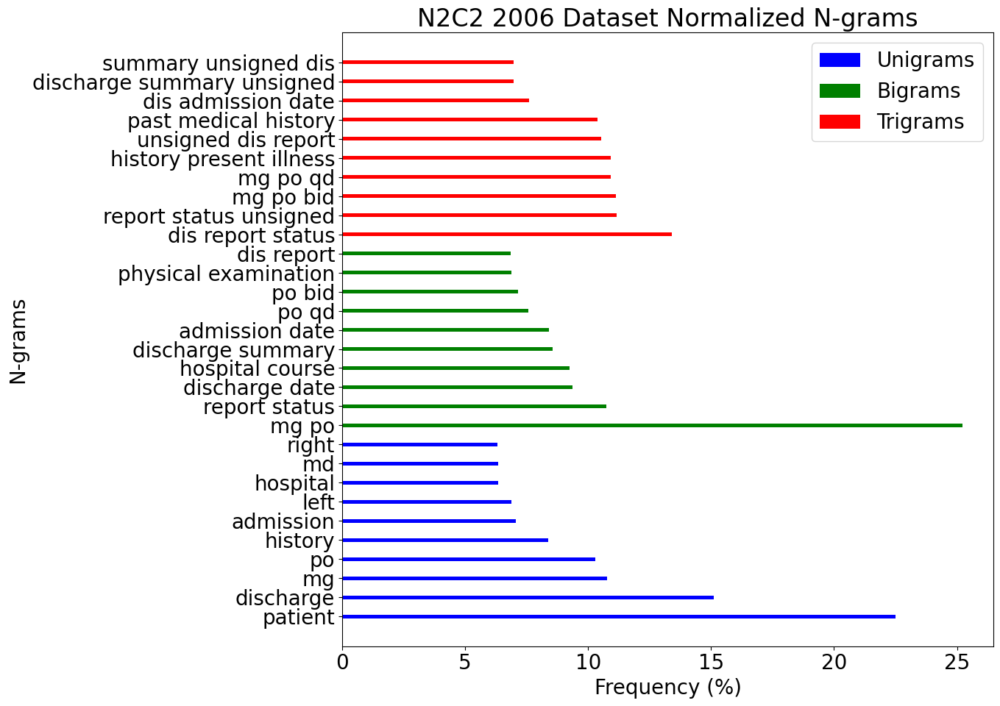

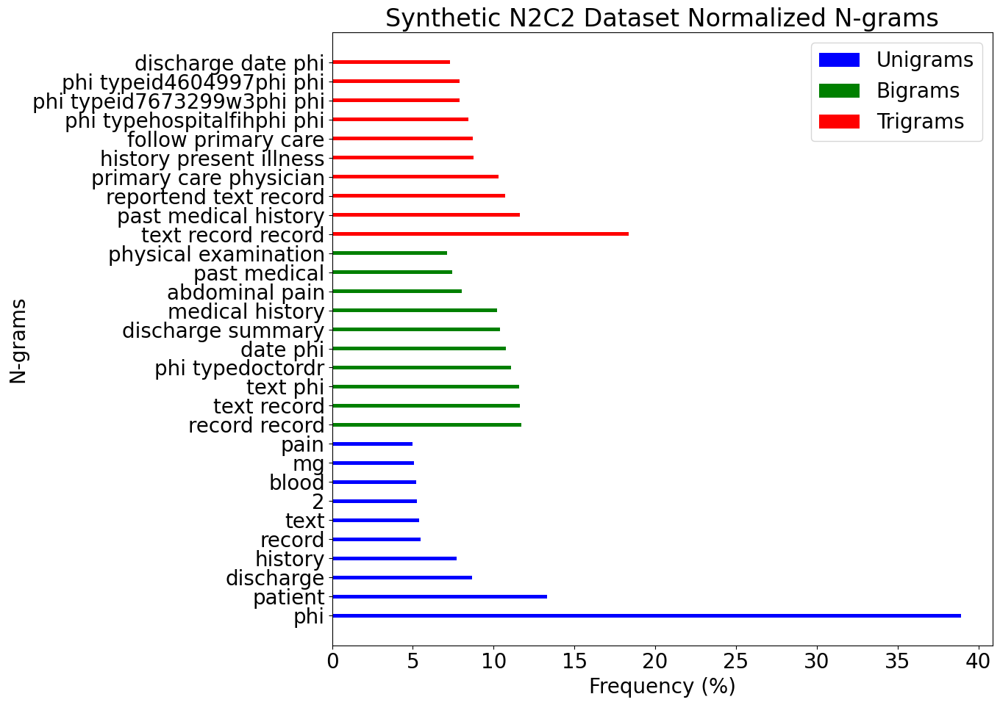

In [27]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_ngrams(ngram_freq, total):
    return [(ngram, count / total * 100) for ngram, count in ngram_freq]

def plot_normalized_ngrams(unigrams, bigrams, trigrams, title, output_filename):
    plt.rcParams.update({'font.size': 20})

    total_unigrams = sum([count for _, count in unigrams])
    total_bigrams = sum([count for _, count in bigrams])
    total_trigrams = sum([count for _, count in trigrams])

    unigrams_norm = normalize_ngrams(unigrams, total_unigrams)
    bigrams_norm = normalize_ngrams(bigrams, total_bigrams)
    trigrams_norm = normalize_ngrams(trigrams, total_trigrams)

    unigram_labels = [label for label, _ in unigrams_norm]
    bigram_labels = [" ".join(pair) for pair, _ in bigrams_norm]
    trigram_labels = [" ".join(trio) for trio, _ in trigrams_norm]

    all_labels = unigram_labels + bigram_labels + trigram_labels
    indices = np.arange(len(all_labels))

    unigram_values = [value for _, value in unigrams_norm]
    bigram_values = [value for _, value in bigrams_norm]
    trigram_values = [value for _, value in trigrams_norm]

    fig, ax = plt.subplots(figsize=(14, 10)) 
    bar_width = 0.20  
    ax.barh(indices[:len(unigram_values)], unigram_values, height=bar_width, label='Unigrams', color='blue')
    ax.barh(indices[len(unigram_values):len(unigram_values) + len(bigram_values)], bigram_values, height=bar_width, label='Bigrams', color='green')
    ax.barh(indices[len(unigram_values) + len(bigram_values):], trigram_values, height=bar_width, label='Trigrams', color='red')

    ax.set_yticks(indices)
    ax.set_yticklabels(all_labels)
    ax.set_xlabel('Frequency (%)')
    ax.set_ylabel('N-grams')
    ax.set_title(title)
    ax.legend()

    plt.tight_layout()

    fig.savefig(f"{output_filename}.pdf", format='pdf', dpi=600) 
    plt.show()

plot_normalized_ngrams(top_unigrams_combined, top_bigrams_combined, top_trigrams_combined, "N2C2 2006 Dataset Normalized N-grams", "n2c2ngramsplot")
plot_normalized_ngrams(top_unigrams_annotated, top_bigrams_annotated, top_trigrams_annotated, "Synthetic N2C2 Dataset Normalized N-grams", "n2c2synngramplot")


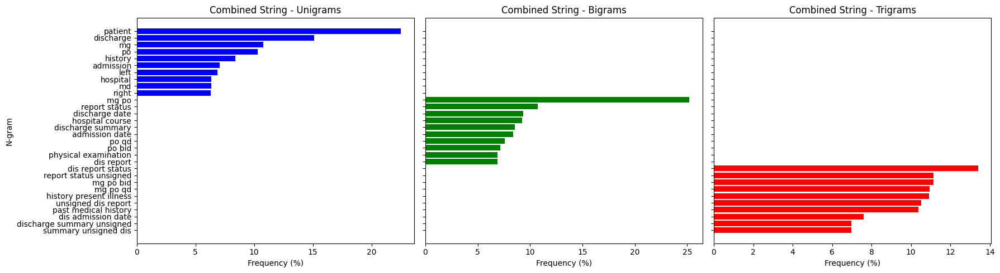

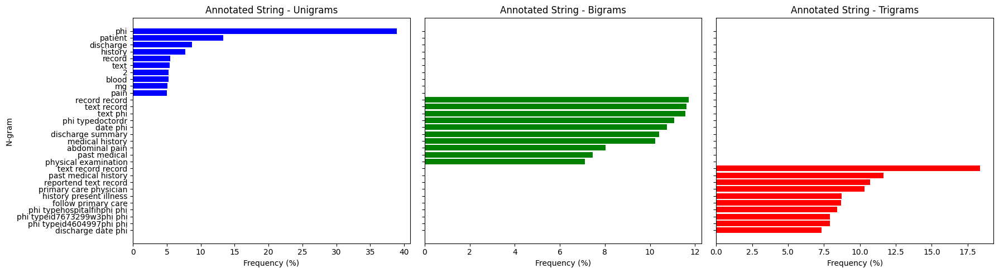

In [60]:
def plot_ngrams_separately(unigrams, bigrams, trigrams, title_prefix):
    fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    labels_unigrams = [label for label, _ in unigrams]
    values_unigrams = [value for _, value in unigrams]
    axs[0].barh(labels_unigrams, values_unigrams, color='blue')
    axs[0].invert_yaxis()
    axs[0].set_title(f'{title_prefix} - Unigrams')
    axs[0].set_xlabel('Frequency (%)')
    axs[0].set_ylabel('N-gram')

    labels_bigrams = [f"{a} {b}" for a, b in dict(bigrams).keys()]
    values_bigrams = [value for _, value in bigrams]
    axs[1].barh(labels_bigrams, values_bigrams, color='green')
    axs[1].invert_yaxis()
    axs[1].set_title(f'{title_prefix} - Bigrams')
    axs[1].set_xlabel('Frequency (%)')

    labels_trigrams = [f"{a} {b} {c}" for a, b, c in dict(trigrams).keys()]
    values_trigrams = [value for _, value in trigrams]
    axs[2].barh(labels_trigrams, values_trigrams, color='red')
    axs[2].invert_yaxis()
    axs[2].set_title(f'{title_prefix} - Trigrams')
    axs[2].set_xlabel('Frequency (%)')

    plt.tight_layout()
    plt.show()

plot_ngrams_separately(top_unigrams_combined_norm, top_bigrams_combined_norm, top_trigrams_combined_norm, "Combined String")

plot_ngrams_separately(top_unigrams_annotated_norm, top_bigrams_annotated_norm, top_trigrams_annotated_norm, "Annotated String")


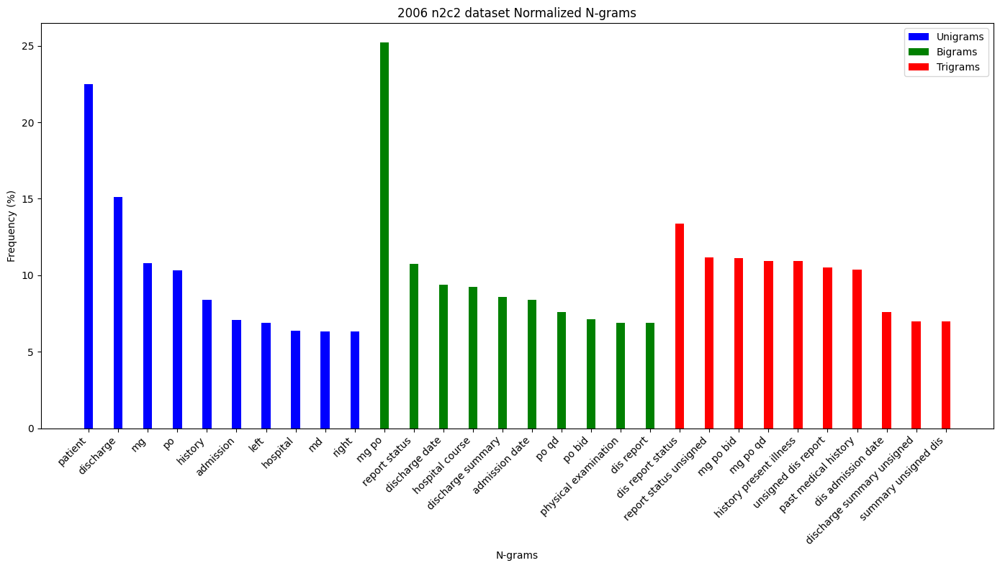

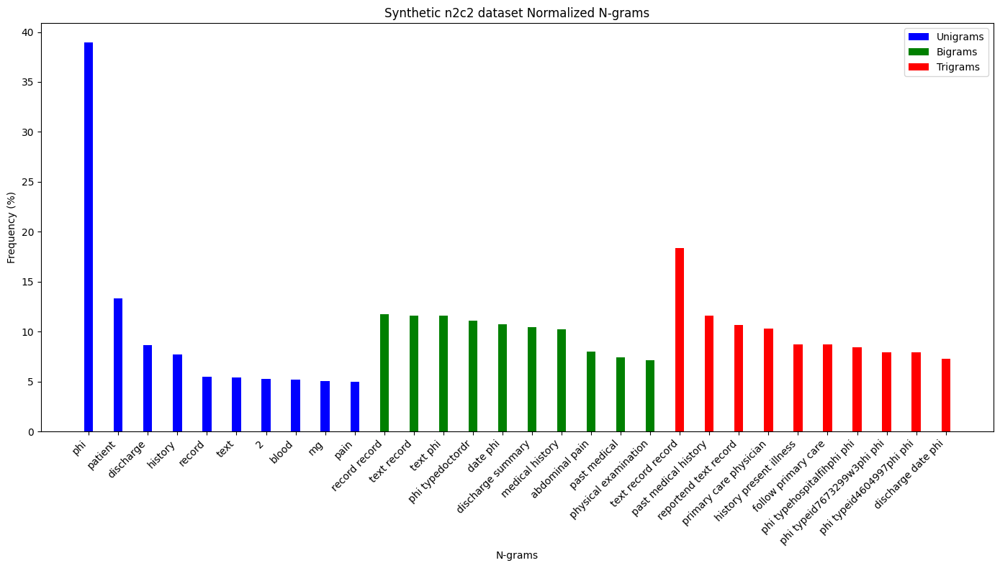

In [61]:
def normalize_ngrams(ngram_freq, total):
    return [(ngram, count / total * 100) for ngram, count in ngram_freq]

def plot_normalized_ngrams(unigrams, bigrams, trigrams, title, output_filename):
    total_unigrams = sum([count for _, count in unigrams])
    total_bigrams = sum([count for _, count in bigrams])
    total_trigrams = sum([count for _, count in trigrams])

    unigrams_norm = normalize_ngrams(unigrams, total_unigrams)
    bigrams_norm = normalize_ngrams(bigrams, total_bigrams)
    trigrams_norm = normalize_ngrams(trigrams, total_trigrams)

    unigram_labels = [label for label, _ in unigrams_norm]
    unigram_values = [value for _, value in unigrams_norm]

    bigram_labels = [" ".join(pair) for pair, _ in bigrams_norm]
    bigram_values = [value for _, value in bigrams_norm]

    trigram_labels = [" ".join(trio) for trio, _ in trigrams_norm]
    trigram_values = [value for _, value in trigrams_norm]

    all_labels = unigram_labels + bigram_labels + trigram_labels
    indices = np.arange(len(all_labels))

    bar_width = 0.3

    fig, ax = plt.subplots(figsize=(14, 8))
    ax.bar(indices[:len(unigram_values)], unigram_values, width=bar_width, label="Unigrams", color="blue")
    ax.bar(indices[len(unigram_values):len(unigram_values) + len(bigram_values)], bigram_values, width=bar_width, label="Bigrams", color="green")
    ax.bar(indices[len(unigram_values) + len(bigram_values):], trigram_values, width=bar_width, label="Trigrams", color="red")

    ax.set_xticks(indices)
    ax.set_xticklabels(all_labels, rotation=45, ha="right")

    ax.set_ylabel('Frequency (%)')
    ax.set_xlabel('N-grams')
    ax.set_title(title)
    ax.legend()
    plt.tight_layout()
    fig.savefig(output_filename, format='png', dpi=300)
    plt.show()

plot_normalized_ngrams(top_unigrams_combined, top_bigrams_combined, top_trigrams_combined, "2006 n2c2 dataset Normalized N-grams", "combined_ngram_plot.png")
plot_normalized_ngrams(top_unigrams_annotated, top_bigrams_annotated, top_trigrams_annotated, "Synthetic n2c2 dataset Normalized N-grams", "annotated_ngram_plot.png")


In [28]:
import numpy as np

def compute_statistics(text):
    words = text.split()
    num_chars = len(text)
    num_words = len(words)
    
    word_lengths = [len(word) for word in words]
    mean_word_length = np.mean(word_lengths)
    std_error_word_length = np.std(word_lengths) / np.sqrt(len(word_lengths))
    median_word_length = np.median(word_lengths)
    min_word_length = np.min(word_lengths)
    max_word_length = np.max(word_lengths)
    
    return {
        'Total Characters': num_chars,
        'Total Words': num_words,
        'Mean Word Length': mean_word_length,
        'SE Word Length': std_error_word_length,
        'Median Word Length': median_word_length,
        'Min Word Length': min_word_length,
        'Max Word Length': max_word_length
    }

combined_stats = compute_statistics(combined_string)
annotated_stats = compute_statistics(annotated_string)

print("Statistics for Combined String:")
for key, value in combined_stats.items():
    print(f"{key}: {value}")

print("\nStatistics for Annotated String:")
for key, value in annotated_stats.items():
    print(f"{key}: {value}")


Statistics for Combined String:
Total Characters: 4098092
Total Words: 726860
Mean Word Length: 4.638077483972154
SE Word Length: 0.003759348827754103
Median Word Length: 4.0
Min Word Length: 1
Max Word Length: 50

Statistics for Annotated String:
Total Characters: 5022667
Total Words: 721886
Mean Word Length: 5.9321859684216065
SE Word Length: 0.0056549412957899465
Median Word Length: 5.0
Min Word Length: 1
Max Word Length: 89


In [29]:
import re
from collections import Counter
from nltk import bigrams, trigrams, word_tokenize
from nltk.corpus import stopwords

# Initialize stop words
stop_words = set(stopwords.words('english'))

# Function to clean and tokenize text
def clean_and_tokenize(text):
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text.lower())
    words = word_tokenize(text)
    return [word for word in words if word not in stop_words and 'phi' not in word and 'type' not in word]

# Function to extract context without PHI tags
def extract_context_without_phi(text, window_size=5):
    # Regex pattern for PHI tags
    phi_regex = re.compile(r'</?PHI[^>]*>')

    # Find positions of PHI tags
    phi_positions = [(m.start(), m.end()) for m in phi_regex.finditer(text)]

    words = []
    prev_end = 0
    for start, end in phi_positions:
        # Get context before and after PHI tags
        context_before = clean_and_tokenize(text[prev_end:start])
        context_after = clean_and_tokenize(text[end:min(len(text), end + window_size * 10)])

        words.extend(context_before)
        words.extend(context_after)

        prev_end = end

    # Include remaining text after the last PHI tag
    if prev_end < len(text):
        words.extend(clean_and_tokenize(text[prev_end:]))

    # Compute top unigrams, bigrams, and trigrams
    top_unigrams = Counter(words).most_common(10)
    top_bigrams = Counter(bigrams(words)).most_common(10)
    top_trigrams = Counter(trigrams(words)).most_common(10)

    return top_unigrams, top_bigrams, top_trigrams

# Example usage
top_unigrams_annotated, top_bigrams_annotated, top_trigrams_annotated = extract_context_without_phi(annotated_string)
top_unigrams_combined, top_bigrams_combined, top_trigrams_combined = extract_context_without_phi(combined_string)

# Print results for annotated text
print("\nTop 10 Surrounding Unigrams (Annotated):")
for unigram, count in top_unigrams_annotated:
    print(f"{unigram}: {count}")

print("\nTop 10 Surrounding Bigrams (Annotated):")
for bigram, count in top_bigrams_annotated:
    print(f"{bigram}: {count}")

print("\nTop 10 Surrounding Trigrams (Annotated):")
for trigram, count in top_trigrams_annotated:
    print(f"{trigram}: {count}")

# Print results for combined text
print("\nTop 10 Surrounding Unigrams (Combined):")
for unigram, count in top_unigrams_combined:
    print(f"{unigram}: {count}")

print("\nTop 10 Surrounding Bigrams (Combined):")
for bigram, count in top_bigrams_combined:
    print(f"{bigram}: {count}")

print("\nTop 10 Surrounding Trigrams (Combined):")
for trigram, count in top_trigrams_combined:
    print(f"{trigram}: {count}")



Top 10 Surrounding Unigrams (Annotated):
discharge: 10794
patient: 9555
record: 5460
text: 5159
date: 5128
history: 5003
summary: 4683
dr: 4414
2: 3472
pain: 3406

Top 10 Surrounding Bigrams (Annotated):
('discharge', 'summary'): 3807
('text', 'record'): 2903
('record', 'record'): 2469
('reportend', 'text'): 2197
('discharge', 'date'): 2006
('medical', 'history'): 1512
('report', 'status'): 1467
('admission', 'date'): 1425
('abdominal', 'pain'): 1286
('date', 'discharge'): 1141

Top 10 Surrounding Trigrams (Annotated):
('text', 'record', 'record'): 2447
('reportend', 'text', 'record'): 1843
('past', 'medical', 'history'): 1036
('primary', 'care', 'physician'): 930
('history', 'present', 'illness'): 881
('follow', 'primary', 'care'): 798
('discharge', 'summary', 'patient'): 770
('120000', 'discharge', 'summary'): 743
('abdomen', 'soft', 'nontender'): 556
('abdominal', 'pain', 'diarrhea'): 546

Top 10 Surrounding Unigrams (Combined):
patient: 7831
discharge: 5252
mg: 3752
po: 3584
histo

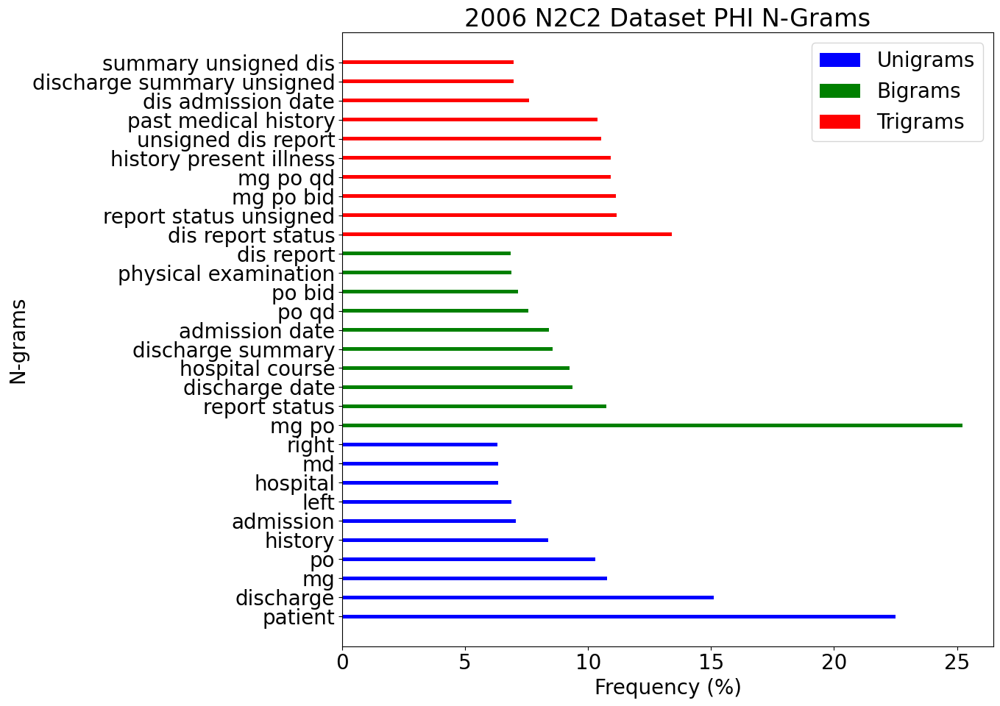

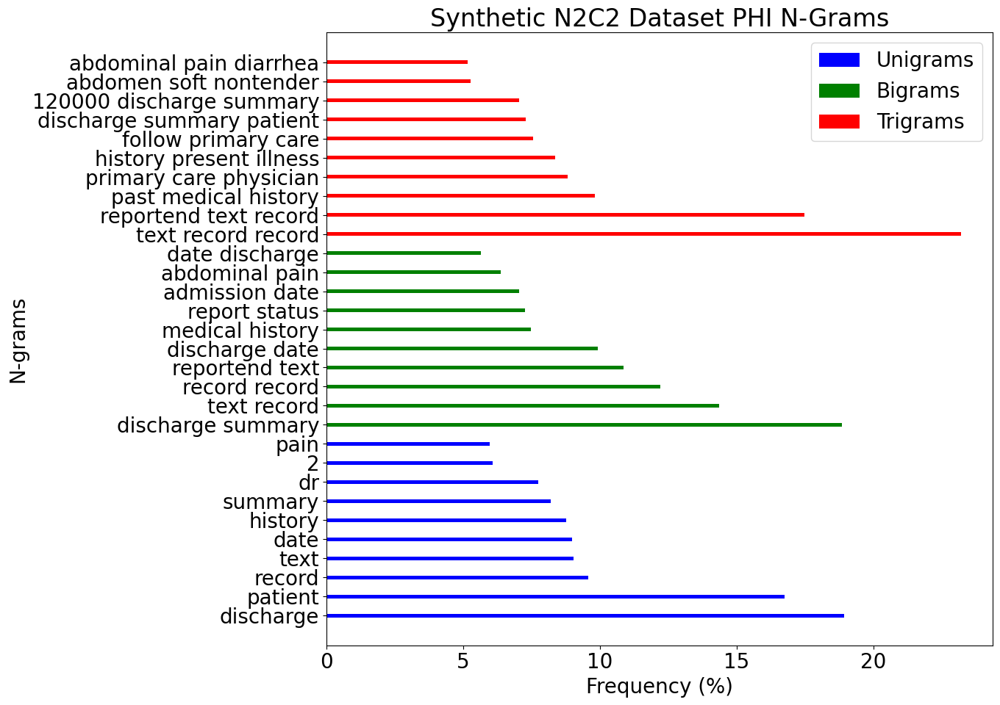

In [31]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_ngrams(ngram_freq, total):
    return [(ngram, count / total * 100) for ngram, count in ngram_freq]

def plot_normalized_ngrams(unigrams, bigrams, trigrams, title, output_filename):
    plt.rcParams.update({'font.size': 20})

    total_unigrams = sum([count for _, count in unigrams])
    total_bigrams = sum([count for _, count in bigrams])
    total_trigrams = sum([count for _, count in trigrams])

    unigrams_norm = normalize_ngrams(unigrams, total_unigrams)
    bigrams_norm = normalize_ngrams(bigrams, total_bigrams)
    trigrams_norm = normalize_ngrams(trigrams, total_trigrams)

    unigram_labels = [label for label, _ in unigrams_norm]
    bigram_labels = [" ".join(pair) for pair, _ in bigrams_norm]
    trigram_labels = [" ".join(trio) for trio, _ in trigrams_norm]

    all_labels = unigram_labels + bigram_labels + trigram_labels
    indices = np.arange(len(all_labels))

    unigram_values = [value for _, value in unigrams_norm]
    bigram_values = [value for _, value in bigrams_norm]
    trigram_values = [value for _, value in trigrams_norm]

    fig, ax = plt.subplots(figsize=(14, 10)) 
    bar_width = 0.20  
    ax.barh(indices[:len(unigram_values)], unigram_values, height=bar_width, label='Unigrams', color='blue')
    ax.barh(indices[len(unigram_values):len(unigram_values) + len(bigram_values)], bigram_values, height=bar_width, label='Bigrams', color='green')
    ax.barh(indices[len(unigram_values) + len(bigram_values):], trigram_values, height=bar_width, label='Trigrams', color='red')

    ax.set_yticks(indices)
    ax.set_yticklabels(all_labels)
    ax.set_xlabel('Frequency (%)')
    ax.set_ylabel('N-grams')
    ax.set_title(title)
    ax.legend()

    plt.tight_layout()

    fig.savefig(f"{output_filename}.pdf", format='pdf', dpi=600) 
    plt.show()

plot_normalized_ngrams(top_unigrams_combined, top_bigrams_combined, top_trigrams_combined, "2006 N2C2 Dataset PHI N-Grams", "PHIn2c2ngramsplot")
plot_normalized_ngrams(top_unigrams_annotated, top_bigrams_annotated, top_trigrams_annotated, "Synthetic N2C2 Dataset PHI N-Grams", "PHIn2c2synngramplot")


In [32]:
def jaccard_distance(set1, set2):
    """Calculate the Jaccard distance between two sets."""
    intersection = set1.intersection(set2)
    union = set1.union(set2)
    return 1 - len(intersection) / len(union)

In [33]:
set_combined = set(tokens_combined)
set_annotated = set(tokens_annotated)

In [34]:
distance = jaccard_distance(set_combined, set_annotated)
print(f"Jaccard Distance: {distance}")

Jaccard Distance: 0.8251394535312471


In [35]:
import sys
sys.path.insert(0, '/home/niralee/de-id/bert_score')

In [36]:
from bert_score import score

In [39]:
def chunk_text(sentences, chunk_size):
    chunks = []
    for i in range(0, len(sentences), chunk_size):
        chunk = " ".join(sentences[i:i + chunk_size])
        chunks.append(chunk)
    return chunks

In [41]:
import nltk
from nltk.tokenize import sent_tokenize

nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/niralee/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [59]:
chunk_size = 10

In [60]:
sentences_text1 = sent_tokenize(combined_string)
sentences_text2 = sent_tokenize(annotated_string)

In [61]:
chunks_text1 = chunk_text(sentences_text1, 10)
chunks_text2 = chunk_text(sentences_text2, 10)

In [62]:
total_comparisons = len(chunks_text1) * len(chunks_text2)
progress = tqdm(total=total_comparisons, desc="Processing Comparisons")

scores_p = []
scores_r = []
scores_f1 = []

for chunk1 in chunks_text1:
    for chunk2 in chunks_text2:
        P, R, F1 = score([chunk1], [chunk2], lang='en', model_type="dmis-lab/biobert-v1.1")
        scores_p.append(P.mean().item())
        scores_r.append(R.mean().item())
        scores_f1.append(F1.mean().item())
        progress.update(1)  

progress.close()  

average_p = sum(scores_p) / len(scores_p)
average_r = sum(scores_r) / len(scores_r)
average_f1 = sum(scores_f1) / len(scores_f1)

print("Average Precision: ", average_p)
print("Average Recall: ", average_r)
print("Average F1 Score: ", average_f1)

Processing Comparisons:   0%|                                                  | 18/20422300 [00:21<6917:28:19,  1.22s/it]

KeyboardInterrupt: 

In [ ]:
from multiprocessing import Pool
from bert_score import score
from functools import partial

def compute_score(chunk1, chunk2, model_type="dmis-lab/biobert-v1.1"):
    P, R, F1 = score([chunk1], [chunk2], lang='en', model_type=model_type)
    return P.mean().item(), R.mean().item(), F1.mean().item()

def main():
    # Assuming chunks_text1 and chunks_text2 are predefined lists of text chunks
    with Pool(processes=4) as pool:  # Adjust the number of processes based on your CPU
        results = pool.starmap(compute_score, [(c1, c2) for c1 in chunks_text1 for c2 in chunks_text2])

    # Extract and average scores
    scores_p = [result[0] for result in results]
    scores_r = [result[1] for result in results]
    scores_f1 = [result[2] for result in results]
    average_p = sum(scores_p) / len(scores_p)
    average_r = sum(scores_r) / len(scores_r)
    average_f1 = sum(scores_f1) / len(scores_f1)

    print("Average Precision: ", average_p)
    print("Average Recall: ", average_r)
    print("Average F1 Score: ", average_f1)

if __name__ == "__main__":
    main()


In [49]:
# Display progress as BERTScore processes each list of sentences
with tqdm(total=len(sentences_text1) + len(sentences_text2), desc="Computing BERTScore") as pbar:
    P, R, F1 = score([chunk1], [chunk2], lang='en', model_type="dmis-lab/biobert-v1.1")
    pbar.update(len(sentences_text1))
    pbar.update(len(sentences_text2))

print("Precision: ", P.mean())
print("Recall: ", R.mean())
print("F1 Score: ", F1.mean())

Computing BERTScore: 100%|███████████████████████████████████████████████████████| 90389/90389 [00:01<00:00, 47900.17it/s]

Precision:  tensor(0.6666)
Recall:  tensor(0.6118)
F1 Score:  tensor(0.6380)


In [ ]:
P, R, F1 = score([combined_string], [annotated_string], lang='en', model_type="dmis-lab/biobert-v1.1")
print("Precision:", P)
print("Recall:", R)
print("F1 Score:", F1)

In [ ]:
from bert_score import score
import textwrap
from tqdm import tqdm

def chunk_text(text, max_length=500):
    return textwrap.wrap(text, max_length)

def compute_average_bertscore(cands, refs, lang="en", model_type="dmis-lab/biobert-v1.1"):
    P_scores = []
    R_scores = []
    F1_scores = []

    for cand_chunk, ref_chunk in tqdm(zip(cands, refs), total=len(cands), desc="Computing BERTScore"):
        P, R, F1 = score([cand_chunk], [ref_chunk], lang=lang, model_type=model_type, verbose=False)
        P_scores.append(P.mean().item())
        R_scores.append(R.mean().item())
        F1_scores.append(F1.mean().item())
    
    avg_P = sum(P_scores) / len(P_scores)
    avg_R = sum(R_scores) / len(R_scores)
    avg_F1 = sum(F1_scores) / len(F1_scores)

    return avg_P, avg_R, avg_F1



In [ ]:
candidate_chunks = chunk_text(combined_string, max_length=500)
reference_chunks = chunk_text(annotated_string, max_length=500)


In [ ]:
average_P, average_R, average_F1 = compute_average_bertscore(candidate_chunks, reference_chunks)

print("Average Precision:", average_P)
print("Average Recall:", average_R)
print("Average F1 Score:", average_F1)